
#Summary: The Steinmetz Neural Dataset
**Summary: The Steinmetz Neural Dataset**

The Steinmetz dataset holds information about rodent brains. Scientists gathered this data through experiments to learn how brain cells work when rodents see, move, or think. Using this data, we create models that can predict how rodents' brains will react in different situations, based on recordings from any brain region. This helps us understand how the brain works and controls behaviors, like a glimpse into its inner workings.


## Loading of Steinmetz data

includes some visualizations

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

In [2]:
# @title Figure settings
from matplotlib import rcParams

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True


In [3]:
# @title Data retrieval
import os, requests

fname = []
for j in range(3):
  fname.append('steinmetz_part%d.npz'%j)
url = ["https://osf.io/agvxh/download"]
url.append("https://osf.io/uv3mw/download")
url.append("https://osf.io/ehmw2/download")

for j in range(len(url)):
  if not os.path.isfile(fname[j]):
    try:
      r = requests.get(url[j])
    except requests.ConnectionError:
      print("!!! Failed to download data !!!")
    else:
      if r.status_code != requests.codes.ok:
        print("!!! Failed to download data !!!")
      else:
        with open(fname[j], "wb") as fid:
          fid.write(r.content)

In [4]:
# @title Data loading
alldat = np.array([])
for j in range(len(fname)):
  alldat = np.hstack((alldat,
                      np.load('steinmetz_part%d.npz'%j,
                              allow_pickle=True)['dat']))

`alldat` contains 39 sessions from 10 mice, data from Steinmetz et al, 2019. Time bins for all measurements are 10ms, starting 500ms before stimulus onset. The mouse had to determine which side has the highest contrast. For each `dat = alldat[k]`, you have the fields below. For extra variables, check out the extra notebook and extra data files (lfp, waveforms and exact spike times, non-binned).

* `dat['mouse_name']`: mouse name
* `dat['date_exp']`: when a session was performed
* `dat['spks']`: neurons by trials by time bins.    
* `dat['brain_area']`: brain area for each neuron recorded.
* `dat['ccf']`: Allen Institute brain atlas coordinates for each neuron.
* `dat['ccf_axes']`: axes names for the Allen CCF.
* `dat['contrast_right']`: contrast level for the right stimulus, which is always contralateral to the recorded brain areas.
* `dat['contrast_left']`: contrast level for left stimulus.
* `dat['gocue']`: when the go cue sound was played.
* `dat['response_time']`: when the response was registered, which has to be after the go cue. The mouse can turn the wheel before the go cue (and nearly always does!), but the stimulus on the screen won't move before the go cue.  
* `dat['response']`: which side the response was (`-1`, `0`, `1`). When the right-side stimulus had higher contrast, the correct choice was `-1`. `0` is a no go response.
* `dat['feedback_time']`: when feedback was provided.
* `dat['feedback_type']`: if the feedback was positive (`+1`, reward) or negative (`-1`, white noise burst).  
* `dat['wheel']`: turning speed of the wheel that the mice uses to make a response, sampled at `10ms`.
* `dat['pupil']`: pupil area  (noisy, because pupil is very small) + pupil horizontal and vertical position.
* `dat['face']`: average face motion energy from a video camera.
* `dat['licks']`: lick detections, 0 or 1.   
* `dat['trough_to_peak']`: measures the width of the action potential waveform for each neuron. Widths `<=10` samples are "putative fast spiking neurons".
* `dat['%X%_passive']`: same as above for `X` = {`spks`, `pupil`, `wheel`, `contrast_left`, `contrast_right`} but for  passive trials at the end of the recording when the mouse was no longer engaged and stopped making responses.
* `dat['prev_reward']`: time of the feedback (reward/white noise) on the previous trial in relation to the current stimulus time.
* `dat['reaction_time']`: ntrials by 2. First column: reaction time computed from the wheel movement as the first sample above `5` ticks/10ms bin. Second column: direction of the wheel movement (`0` = no move detected).  


The original dataset is here: https://figshare.com/articles/dataset/Dataset_from_Steinmetz_et_al_2019/9598406

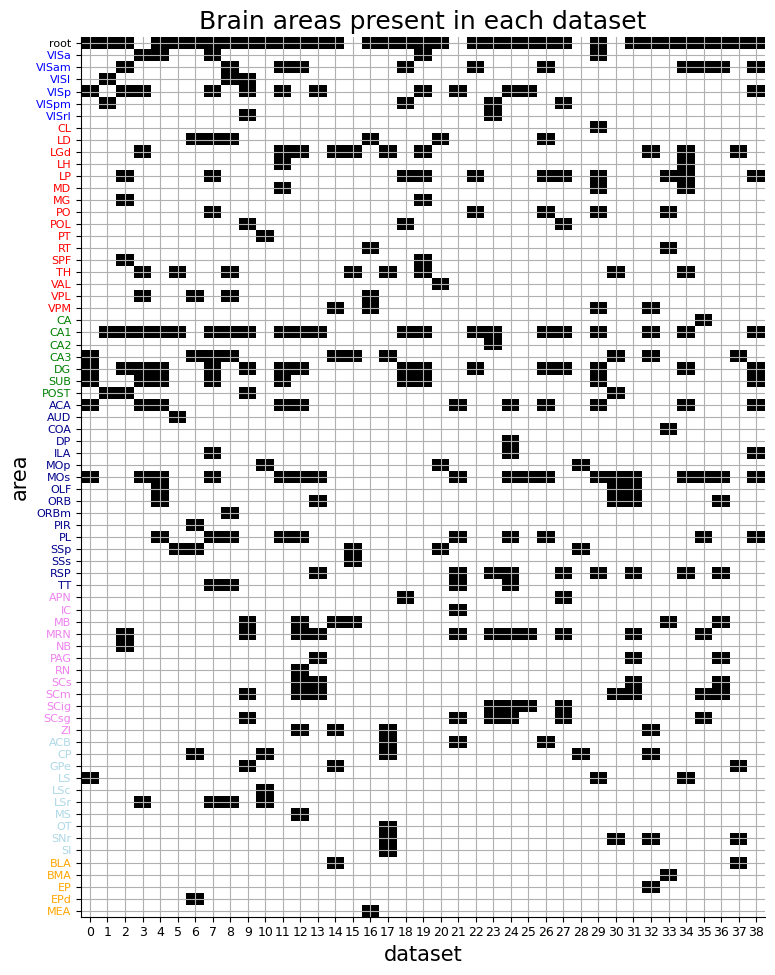

In [9]:
# Make a plot of which brain areas are present in each dataset
# note that region 4 ("other ctx" are neurons that were not able to be classified)
# region 4 does not correspond to brain_group 4, which are all cortical neurons outside of visual cortex
regions = ["vis ctx", "thal", "hipp", "other ctx", "midbrain", "basal ganglia", "cortical subplate", "other"]
region_colors = ['blue', 'red', 'green', 'darkblue', 'violet', 'lightblue', 'orange', 'gray']
brain_groups = [["VISa", "VISam", "VISl", "VISp", "VISpm", "VISrl"],  # visual cortex
                ["CL", "LD", "LGd", "LH", "LP", "MD", "MG", "PO", "POL", "PT", "RT", "SPF", "TH", "VAL", "VPL", "VPM"], # thalamus
                ["CA", "CA1", "CA2", "CA3", "DG", "SUB", "POST"],  # hippocampal
                ["ACA", "AUD", "COA", "DP", "ILA", "MOp", "MOs", "OLF", "ORB", "ORBm", "PIR", "PL", "SSp", "SSs", "RSP","TT"],  # non-visual cortex
                ["APN", "IC", "MB", "MRN", "NB", "PAG", "RN", "SCs", "SCm", "SCig", "SCsg", "ZI"],  # midbrain
                ["ACB", "CP", "GPe", "LS", "LSc", "LSr", "MS", "OT", "SNr", "SI"],  # basal ganglia
                ["BLA", "BMA", "EP", "EPd", "MEA"]  # cortical subplate
                ]

# Assign each area an index
area_to_index = dict(root=0)
counter = 1
for group in brain_groups:
    for area in group:
        area_to_index[area] = counter
        counter += 1

# Figure out which areas are in each dataset
areas_by_dataset = np.zeros((counter, len(alldat)), dtype=bool)
for j, d in enumerate(alldat):
    for area in np.unique(d['brain_area']):
        i = area_to_index[area]
        areas_by_dataset[i, j] = True

# Show the binary matrix
plt.figure(figsize=(8, 10))
plt.imshow(areas_by_dataset, cmap="Greys", aspect="auto", interpolation="none")

# Label the axes
plt.xlabel("dataset")
plt.ylabel("area")

# Add tick labels
yticklabels = ["root"]
for group in brain_groups:
  yticklabels.extend(group)
plt.yticks(np.arange(counter), yticklabels, fontsize=8)
plt.xticks(np.arange(len(alldat)), fontsize=9)

# Color the tick labels by region
ytickobjs = plt.gca().get_yticklabels()
ytickobjs[0].set_color("black")
counter = 1
for group, color in zip(brain_groups, region_colors):
  for area in group:
    ytickobjs[counter].set_color(color)
    counter += 1

plt.title("Brain areas present in each dataset")
plt.grid(True)
plt.show()

In [ ]:
# for more variables check out the additional notebook (load_steinmetz_extra) which includes LFP, waveform shapes and exact spike times (non-binned)

# Correlation between different brain regions while neuron firing


In [34]:
session13_dat = alldat[12]
print(session13_dat.keys())

np.unique(session13_dat['brain_area'])

regions_for_heatmap = ["vis ctx", "thal", "hipp", "other ctx", "midbrain", "basal ganglia", "cortical subplate", "other"]
brain_groups_for_heatmap = [[ "VISam"],  # visual cortex
                ["LGd","MD","LH"], # thalamus
                ["CA1","DG"],  # hippocampal
                ["ACA", "PL","MOs"],  # non-visual cortex
                [ "MB", "MRN",  "RN", "SCs", "SCm", "ZI"],  # midbrain
                ]
# Extract firing rates and brain areas for neurons in session 11
spikes = session13_dat['spks']  # Neurons by trials by time bins
brain_area = session13_dat['brain_area']  # Brain area for each neuron recorded

# Get the number of neurons, trials, and time bins
num_neurons, num_trials, num_time_bins = spikes.shape

# Create a dictionary to store firing rates for each major brain area
firing_rates_by_major_region = {}
firing_rate_major_brain_region_wise={}


# Iterate over major brain regions and aggregate firing rates for neurons within each region
for brain_group, region_names in zip(brain_groups, regions):
    # Find the indices of neurons in the current major brain region
    neuron_indices = [i for i, area in enumerate(brain_area) if area in brain_group]

    # Extract firing rates for neurons in the current major brain region
    firing_rates_major_region = spikes[neuron_indices, :, :]

    # Compute the average firing rate for each neuron across trials
    average_firing_rates = np.mean(firing_rates_major_region, axis=1)

    # Store the average firing rates for the current major brain region
    firing_rates_by_major_region[region_names] = average_firing_rates

    firing_rate_major_brain_region_wise[region_names]=np.mean(average_firing_rates,axis=0)


dict_keys(['spks', 'wheel', 'pupil', 'response', 'response_time', 'bin_size', 'stim_onset', 'contrast_right', 'contrast_left', 'brain_area', 'feedback_time', 'feedback_type', 'gocue', 'mouse_name', 'date_exp', 'trough_to_peak', 'active_trials', 'contrast_left_passive', 'contrast_right_passive', 'spks_passive', 'pupil_passive', 'wheel_passive', 'prev_reward', 'ccf', 'ccf_axes', 'cellid_orig', 'reaction_time', 'face', 'face_passive', 'licks', 'licks_passive'])


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:182: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


In the code snippet the line `average_firing_rates = np.mean(firing_rates_major_region, axis=1)` computes the average firing rate for each neuron across trials within a major brain region. Let's break it down:

`firing_rates_major_region` is a 3-dimensional NumPy array that represents the firing rates of neurons within a major brain region. The dimensions of `firing_rates_major_region` are `(num_neurons, num_trials, num_time_bins)`.

`np.mean()` is a NumPy function that calculates the mean of an array along a specified axis. The `axis` parameter determines which axis to take the mean over. When `axis=1`, it means that we want to calculate the mean across the second axis (num_trials). This operation results in a 2-dimensional array, where each row represents the average firing rate of a neuron across all trials in that major brain region.

In summary, `average_firing_rates` will be a 2-dimensional NumPy array, where each row contains the average firing rate of a neuron across trials in a major brain region. The `axis=1` is crucial here to correctly compute the mean across the trials and obtain the average firing rate for each neuron in a major brain region.

In [35]:
# Compute the correlation matrix between major brain regions based on the aggregated firing rates
correlation_matrix = np.corrcoef(np.vstack(list(firing_rate_major_brain_region_wise.values())))

# Display the correlation matrix
print("Correlation Matrix between Major Brain Regions:")
print(correlation_matrix)

# Find the major brain regions in the dataset
major_brain_regions = list(firing_rate_major_brain_region_wise.keys())

# Display the major brain regions present in session 12
print("Major Brain Regions in Session 12:")
print(major_brain_regions)

Correlation Matrix between Major Brain Regions:
[[ 1.00000000e+00  3.13837236e-01 -9.48758903e-02 -1.31918914e-01
  -6.36910602e-04 -4.35447690e-01             nan]
 [ 3.13837236e-01  1.00000000e+00 -1.28543941e-01  3.77813947e-01
   7.90118552e-01 -8.63336621e-01             nan]
 [-9.48758903e-02 -1.28543941e-01  1.00000000e+00  5.97323747e-01
  -2.72920107e-01  1.51659593e-01             nan]
 [-1.31918914e-01  3.77813947e-01  5.97323747e-01  1.00000000e+00
   2.86202073e-01 -2.90433571e-01             nan]
 [-6.36910602e-04  7.90118552e-01 -2.72920107e-01  2.86202073e-01
   1.00000000e+00 -7.77827541e-01             nan]
 [-4.35447690e-01 -8.63336621e-01  1.51659593e-01 -2.90433571e-01
  -7.77827541e-01  1.00000000e+00             nan]
 [            nan             nan             nan             nan
              nan             nan             nan]]
Major Brain Regions in Session 12:
['vis ctx', 'thal', 'hipp', 'other ctx', 'midbrain', 'basal ganglia', 'cortical subplate']


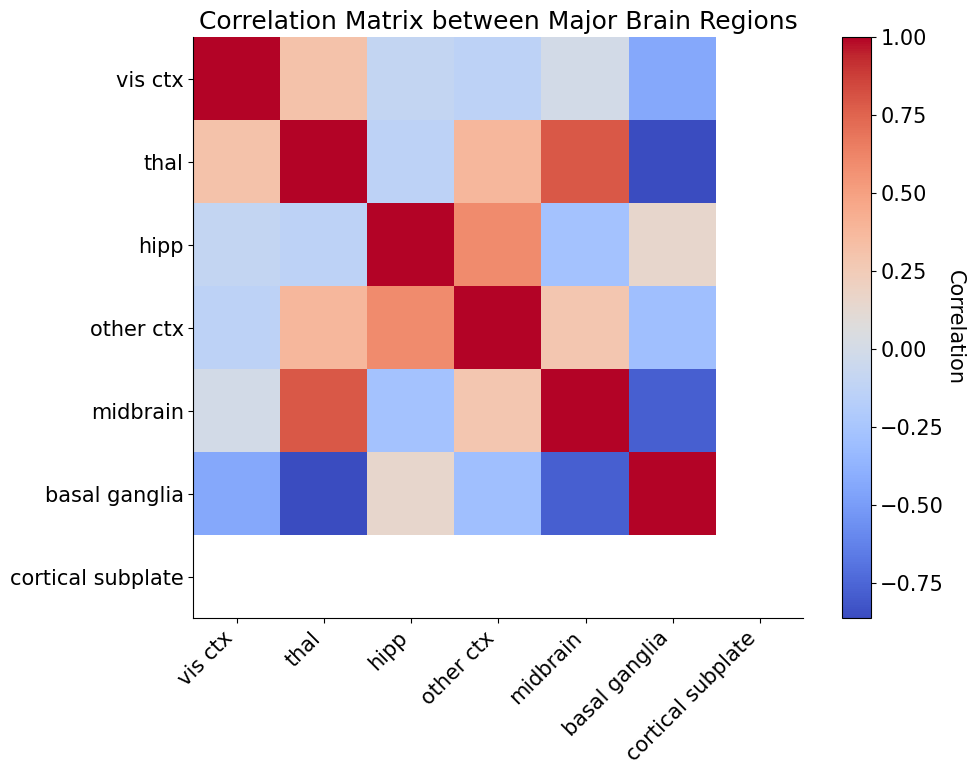

In [36]:
import matplotlib.pyplot as plt

# Compute the correlation matrix between major brain regions based on the aggregated firing rates
correlation_matrix = np.corrcoef(np.vstack(list(firing_rate_major_brain_region_wise.values())))

# Get the major brain regions for labeling the axes
major_brain_regions = list(firing_rate_major_brain_region_wise.keys())

# Create a heatmap
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto')

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('Correlation', rotation=270, labelpad=15)

# Set x and y axis labels
plt.xticks(np.arange(len(major_brain_regions)), major_brain_regions, rotation=45, ha='right')
plt.yticks(np.arange(len(major_brain_regions)), major_brain_regions)

# Add a title
plt.title("Correlation Matrix between Major Brain Regions")

# Show the plot
plt.tight_layout()
plt.show()

The process of decision-making and taking action when a visual stimulus is presented involves a complex interplay of various brain regions. Here's how the structures you mentioned are related in this process:

1. Visual Cortex ("vis ctx"): The visual cortex is the primary area responsible for processing visual information. When a visual stimulus is presented, the visual cortex analyzes and interprets the sensory input, extracting features like shape, color, and motion.

2. Thalamus ("thal"): The thalamus acts as a relay center, receiving information from the visual cortex and other sensory regions. It then relays this processed visual information to other brain areas, including those involved in decision-making and motor control.

3. Hippocampus ("hipp"): The hippocampus is primarily associated with memory and spatial navigation. While it may not be directly involved in immediate decision-making based on visual stimuli, it plays a role in forming memories about past experiences related to similar stimuli, which can influence decision-making in the future.

4. Other Cortical Areas ("other ctx"): Decision-making is a complex cognitive process that often involves integrating information from multiple sensory modalities and cognitive factors. Various other cortical regions, beyond just the visual cortex, contribute to decision-making by providing additional contextual information and facilitating higher-order cognitive processes.

5. Midbrain ("midbrain"): The midbrain, particularly the superior colliculus, is involved in directing attention and eye movements. When a visual stimulus is presented, the midbrain helps orient our attention towards the relevant stimuli, guiding our gaze and focus.

6. Basal Ganglia ("basal ganglia"): The basal ganglia are a group of interconnected nuclei deep within the brain. While the basal ganglia are primarily associated with motor control, they also play a crucial role in decision-making and action selection. They help in filtering and selecting appropriate actions based on the integrated sensory information and cognitive context.

7. Cortical Subplate ("cortical subplate"): The cortical subplate is a transient structure that plays a vital role during brain development, influencing the connectivity and organization of cortical circuits. While its exact role in decision-making related to visual stimuli might not be fully understood, it likely contributes to the overall functioning of the neural circuits involved in decision-making processes.

The decision-making process when a visual stimulus is presented is highly distributed and involves dynamic interactions between these brain regions. The visual information processed in the visual cortex is relayed through the thalamus to other cortical areas and the basal ganglia, which, in turn, integrate this information with other cognitive factors. The midbrain helps guide attention, and the hippocampus may contribute past experiences to influence decision-making. The cortical subplate likely influences the development and organization of neural circuits involved in this complex process.

It's important to emphasize that decision-making is a multifaceted process, and our understanding of the brain's complexity is continually evolving through ongoing research. The relationships and contributions of these brain structures to decision-making might be more intricate than described here, and researchers are continually uncovering new insights into this fascinating aspect of neuroscience.

# Basic plots of population average

Below given code performs a comparative analysis of neural firing patterns in response to different visual stimuli. It iterates through the Steinmetz dataset, computing mean firing rates for specific stimulus conditions, such as left-stimulated, no-left-stimulated, right-stimulated, and no-right-stimulated neurons. The code then calculates average firing rates across the dataset and generates plots to visualize these firing patterns over time. The resulting plots provide insights into how neural activity is modulated by specific visual stimuli.

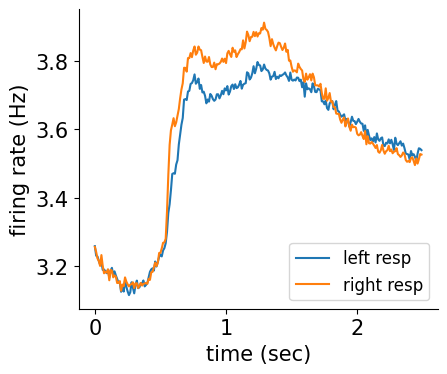

In [10]:
left_response = np.zeros(250, )
right_response = np.zeros(250, )
for i in range(39):
  dat = alldat[i]

  dt = dat['bin_size']  # binning at 10 ms
  NT = dat['spks'].shape[-1]


  ax = plt.subplot(1, 5, 1)
  response = dat['response']  # right - nogo - left (-1, 0, 1)
  vis_right = dat['contrast_right']  # 0 - low - high
  vis_left = dat['contrast_left']  # 0 - low - high


  left_response += 1/dt * dat['spks'][:, response >= 0].mean(axis=(0, 1))
  right_response += 1/dt * dat['spks'][:, response <= 0].mean(axis=(0, 1))


lr = left_response / 39
rr = right_response / 39


plt.plot(0.01 * np.arange(NT), lr)  # left responses
plt.plot(0.01 * np.arange(NT), rr)  # right responses
plt.legend(['left resp', 'right resp', 'right stim', 'no right stim', 'left stim', 'no left stim'], fontsize=12)
ax.set(xlabel='time (sec)', ylabel='firing rate (Hz)')
plt.show()


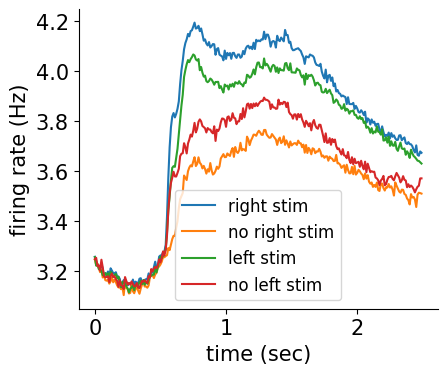

In [ ]:
left_stim = np.zeros(250, )
no_left_stim = np.zeros(250, )
right_stim = np.zeros(250, )
no_right_stim = np.zeros(250, )
for i in range(39):
  dat = alldat[i]

  dt = dat['bin_size']  # binning at 10 ms
  NT = dat['spks'].shape[-1]


  ax = plt.subplot(1, 5, 1)
  response = dat['response']  # right - nogo - left (-1, 0, 1)
  vis_right = dat['contrast_right']  # 0 - low - high
  vis_left = dat['contrast_left']  # 0 - low - high


  right_stim += 1/dt * dat['spks'][:, vis_right > 0].mean(axis=(0, 1))
  no_right_stim += 1/dt * dat['spks'][:, vis_right == 0].mean(axis=(0, 1))
  left_stim += 1/dt * dat['spks'][:, vis_left > 0].mean(axis=(0, 1))
  no_left_stim += 1/dt * dat['spks'][:, vis_left == 0].mean(axis=(0, 1))




rs = right_stim / 39
nrs = no_right_stim / 39
ls = left_stim / 39
nls = no_left_stim / 39

dat = alldat[11]
dt = dat['bin_size']  # binning at 10 ms
NT = dat['spks'].shape[-1]
plt.plot(dt * np.arange(NT), rs)  # left responses
plt.plot(dt * np.arange(NT), nrs)  # right responses
plt.plot(dt * np.arange(NT), ls)  # left responses
plt.plot(dt * np.arange(NT), nls)  # right responses
plt.legend(['right stim', 'no right stim', 'left stim', 'no left stim'], fontsize=12)
ax.set(xlabel='time (sec)', ylabel='firing rate (Hz)')
plt.show()


#Plots by brain region and visual conditions

<ipython-input-19-fdc5522457d7>:19: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right > 0)].mean(axis=(0, 1)))
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
<ipython-input-19-fdc5522457d7>:20: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right == 0)].mean(axis=(0, 1)))
<ipython-input-19-fdc5522457d7>:21: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right == 0)].mean(axis=(0, 1)))
<ipython-input-19-fdc5522457d7>:22: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right > 0)].mean(axis=(0, 1)))


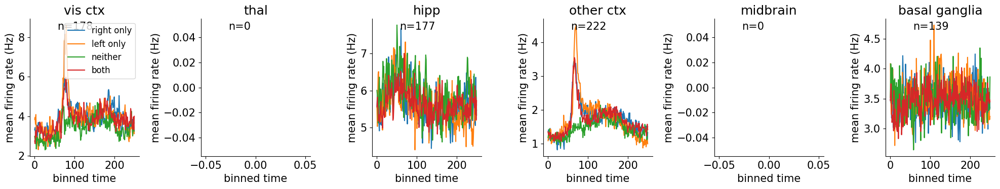

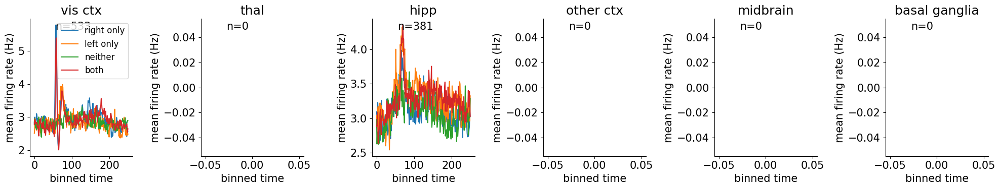

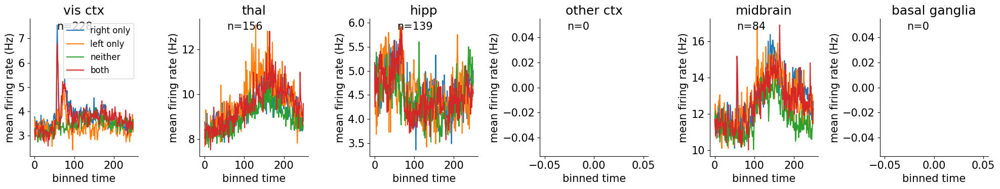

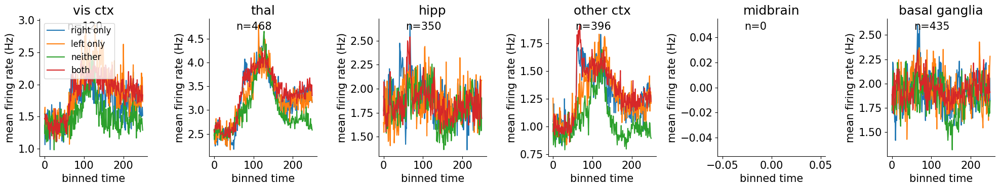

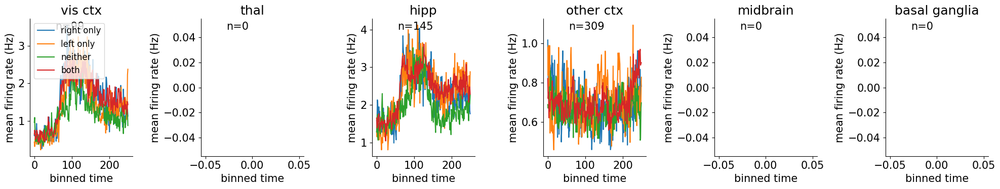

...

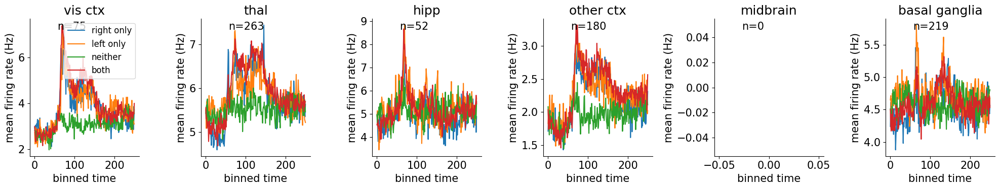

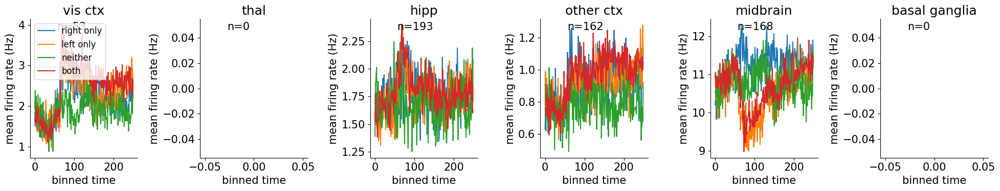

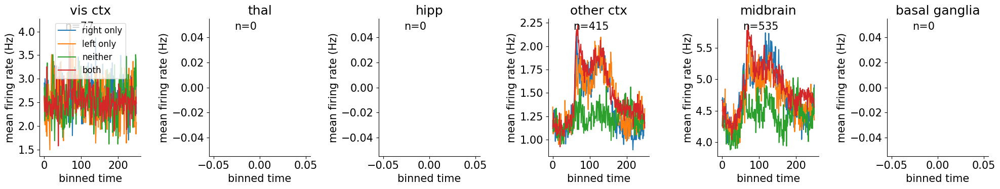

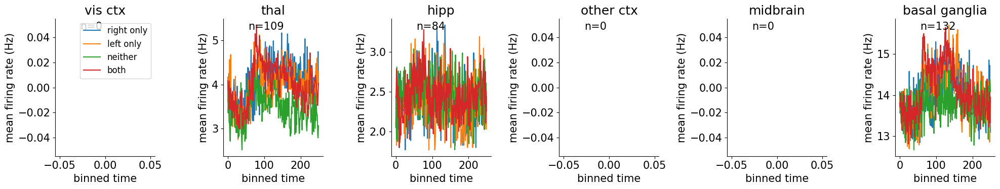

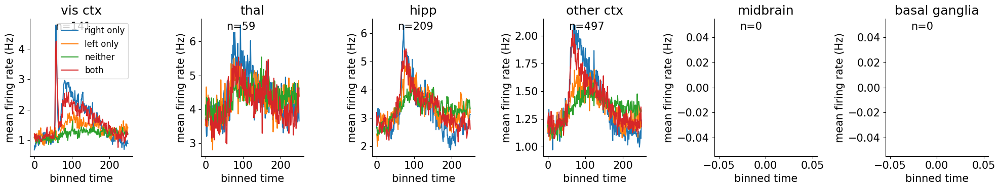

In [ ]:
for i in range(39):
  dat = alldat[i]

  dt = dat['bin_size']  # binning at 10 ms
  NT = dat['spks'].shape[-1]

  response = dat['response']  # right - nogo - left (-1, 0, 1)
  vis_right = dat['contrast_right']  # 0 - low - high
  vis_left = dat['contrast_left']  # 0 - low - high

  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  for j in range(nareas):
    ax = plt.subplot(1, nareas, j + 1)

    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right > 0)].mean(axis=(0, 1)))
    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right == 0)].mean(axis=(0, 1)))
    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right == 0)].mean(axis=(0, 1)))
    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right > 0)].mean(axis=(0, 1)))
    plt.text(.25, .92, 'n=%d'%np.sum(barea == j), transform=ax.transAxes)

    if j==0:
      plt.legend(['right only', 'left only', 'neither', 'both'], fontsize=12)
    ax.set(xlabel='binned time', ylabel='mean firing rate (Hz)', title=regions[j])
  plt.show()


The code uses the Steinmetz dataset to analyze how neurons in various brain regions respond to visual stimuli. It categorizes neurons, generates plots showcasing responses to different visual conditions, and aims to understand region-specific neural activity patterns.

#Logistic regression model on trial  number 12 for all mouses

In [20]:
def sigmoid(z):
  """Return the logistic transform of z."""

  sigmoid = (1 / (np.exp(-z) + 1))

  return sigmoid

In [16]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

In [17]:
def compute_accuracy(X, y, model):
  """Compute accuracy of classifier predictions.

  Args:
    X (2D array): Data matrix
    y (1D array): Label vector
    model (sklearn estimator): Classifier with trained weights.

  Returns:
    accuracy (float): Proportion of correct predictions.
  """

  y_pred = model.predict(X)

  accuracy = (y == y_pred).mean()

  return accuracy

In [21]:
dat = alldat[11]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==1].mean(axis=2).T)) - 0.5
print(X.shape)
y = np.absolute(dat['response'])

(340, 155)


In [22]:
log_reg_l1 = LogisticRegression(penalty="l1", C=100, solver="saga", max_iter=5000)
log_reg_l1.fit(X, y)

LogisticRegression(C=100, max_iter=5000, penalty='l1', solver='saga')

In [23]:

# Compute train accuracy
train_accuracy = compute_accuracy(X, y, log_reg_l1)
print(f"Accuracy on the training data: {train_accuracy:.2%}")

Accuracy on the training data: 99.71%


In [24]:
accuracies = cross_val_score(LogisticRegression(penalty=None), X, y, cv=8)  # k=8 cross validation

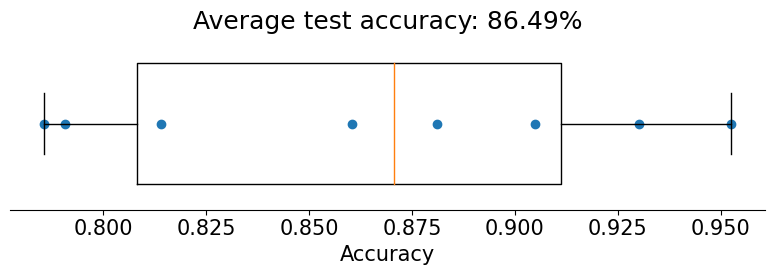

In [25]:
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [26]:
# checking accuracy with penalty
accuracies = cross_val_score(log_reg_l1, X, y, cv=8)  # k=8 cross validation

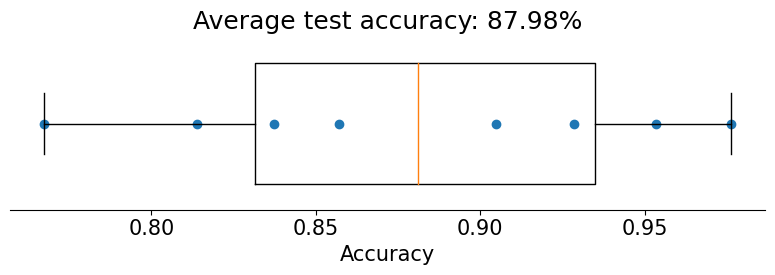

In [27]:
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [32]:
def plot_model_selection(C_values, accuracies):
  """Plot the accuracy curve over log-spaced C values."""
  ax = plt.figure().subplots()
  ax.set_xscale("log")
  ax.plot(C_values, accuracies, marker="o")
  best_C = C_values[np.argmax(accuracies)]
  ax.set(
      xticks=C_values,
      xlabel="$C$",
      ylabel="Cross-validated accuracy",
      title=f"Best C: {best_C:1g} ({np.max(accuracies):.2%})",
  )
  plt.show()


In [29]:
def model_selection(X, y, C_values):
  """Compute CV accuracy for each C value.

  Args:
    X (2D array): Data matrix
    y (1D array): Label vector
    C_values (1D array): Array of hyperparameter values

  Returns:
    accuracies (1D array): CV accuracy with each value of C

  """


  accuracies = []
  for C in C_values:

    # Initialize and fit the model
    # (Hint, you may need to set max_iter)
    model = LogisticRegression(penalty="l1", C=C, solver="saga", max_iter=10000, class_weight='balanced').fit(X, y)

    # Get the accuracy for each test split using cross-validation
    accs = cross_val_score(model, X, y, cv=8)

    # Store the average test accuracy for this value of C
    accuracies.append(accs.mean())

  return accuracies


# Logistic regression on mouse name Lederberg session 13 (12 by index) in differnt brain regions

### Visual cortex

In [ ]:
dat = alldat[12]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==0].mean(axis=2).T)) - 0.5
y = np.absolute(dat['response'])



In [ ]:
accuracies1 = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation

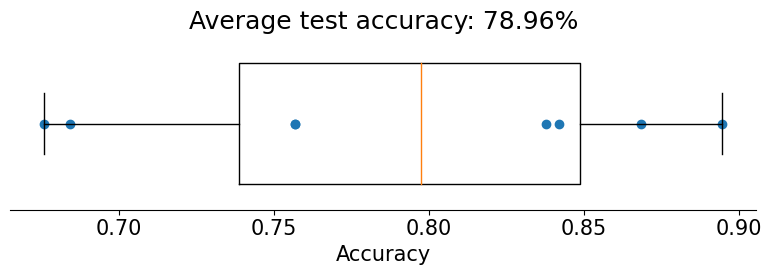

In [ ]:
accuracies1 = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

##Thalamus

In [ ]:
dat = alldat[12]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==1].mean(axis=2).T)) - 0.5
y = np.absolute(dat['response'])


In [ ]:
accuracies2 = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation

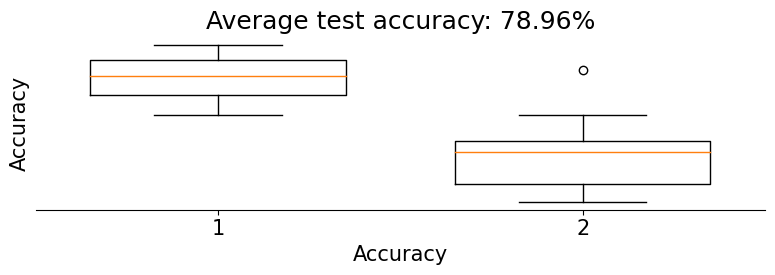

In [ ]:
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot([accuracies1, accuracies2], vert=True, widths=.7)
ax.spines["left"].set_visible(False)
ax.set(
  xlabel="Accuracy",
  ylabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies1.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region

In [ ]:
for j in range(nareas):
  ax = plt.subplot(1, nareas, j + 1)
  plt.boxplot(accuracies1)

  plt.plot(both[j])
  ax.set(xlabel='binned time', ylabel='mean firing rate (Hz)', title=regions[j])
plt.show()


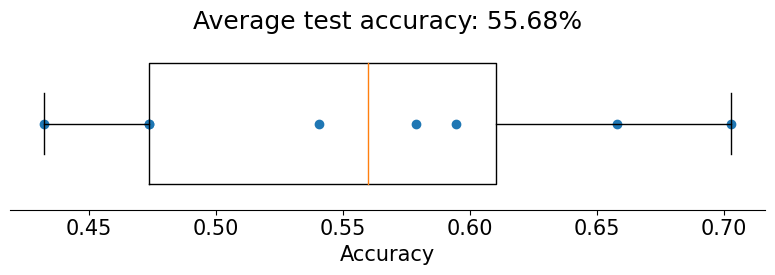

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

KeyboardInterrupt: ignored

##Hippocampus

In [ ]:
dat = alldat[12]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==2].mean(axis=2).T)) - 0.5
y = np.absolute(dat['response'])



In [ ]:
accuracies3 = cross_val_score(LogisticRegression(penalty="l1", C=100, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation

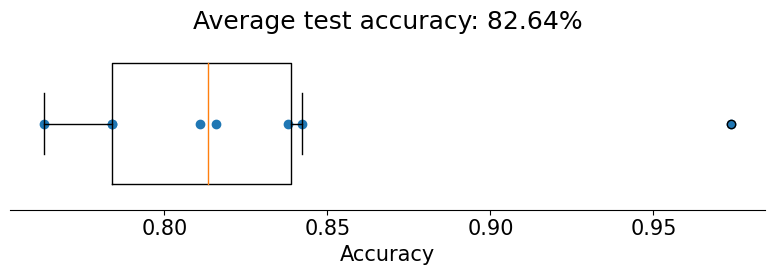

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=100, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

##Other ctx

In [ ]:
dat = alldat[12]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==3].mean(axis=2).T)) - 0.5
y = np.absolute(dat['response'])



In [ ]:
accuracies4 = cross_val_score(LogisticRegression(penalty="l1", C=1000, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation

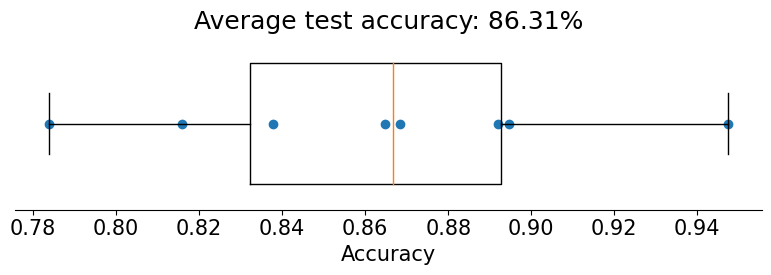

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=1000, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

##Midbrain

In [ ]:
dat = alldat[12]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==4].mean(axis=2).T)) - 0.5
y = np.absolute(dat['response'])



In [ ]:
accuracies5 = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation

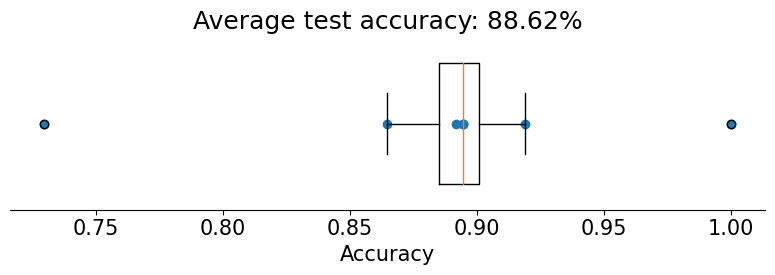

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

##Basal ganglia

In [ ]:
dat = alldat[12]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid((dat['spks'][barea==5].mean(axis=2).T)) - 0.5
y = np.absolute(dat['response'])



In [ ]:
accuracies6 = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation

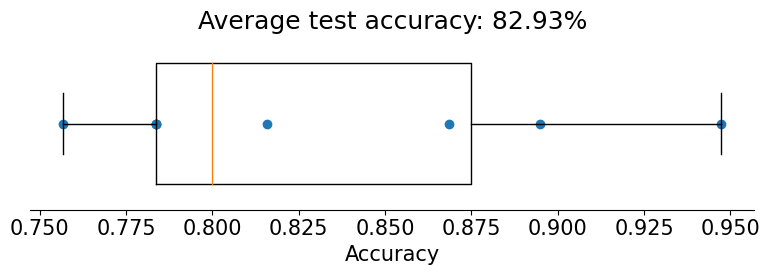

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

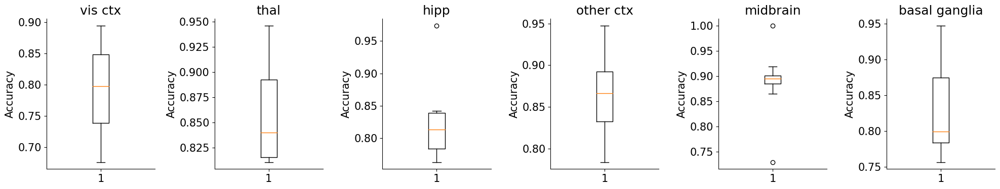

In [ ]:
accuracies = [accuracies1, accuracies2, accuracies3, accuracies4, accuracies5, accuracies6]
for j in range(nareas):
  ax = plt.subplot(1, nareas, j + 1)
  plt.boxplot(accuracies[j])
  ax.set(ylabel='Accuracy', title=regions[j])
plt.show()


In [ ]:
print(accuracies6.mean())
print(accuracies6.std())

0.829302987197724
0.06266261177896336


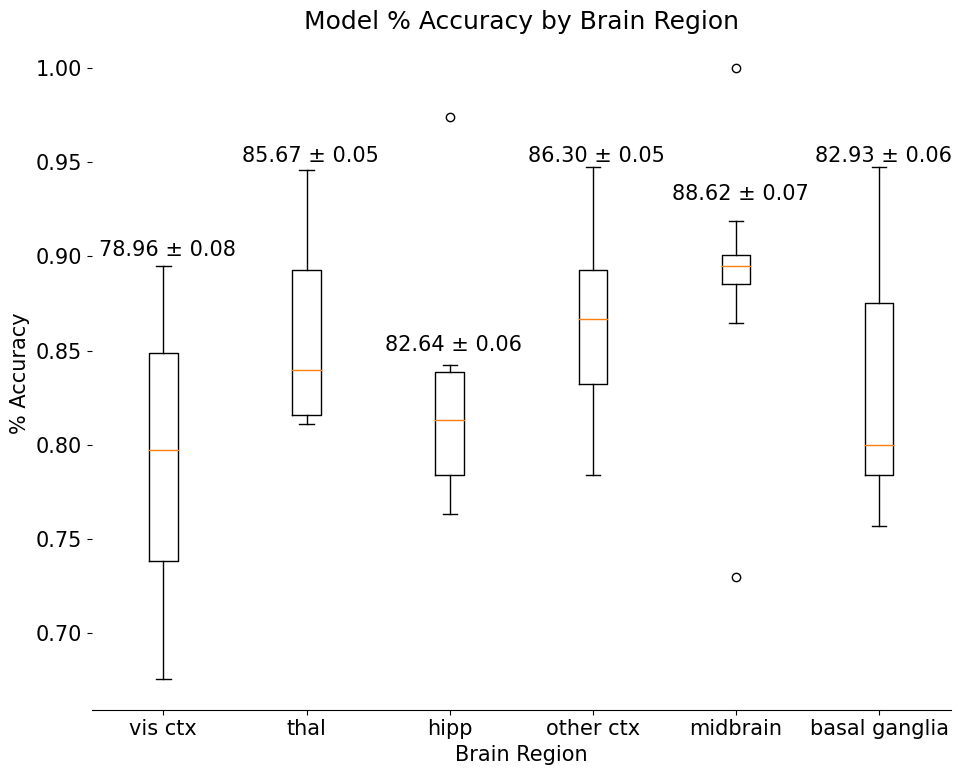

In [ ]:
f, ax = plt.subplots(figsize=(10, 8))
ax.boxplot(accuracies, vert=True, widths=0.2)

ax.spines["left"].set_visible(False)
ax.set(
  xlabel="Brain Region",
  xticklabels = ["vis ctx", "thal", "hipp", "other ctx", "midbrain", "basal ganglia"],
  ylabel="% Accuracy",
  yticks = [0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1],
  title="Model % Accuracy by Brain Region"
)
ax.text(0.55, 0.9, "78.96 ± 0.08")
ax.text(1.55, 0.95, "85.67 ± 0.05")
ax.text(2.55, 0.85, "82.64 ± 0.06")
ax.text(3.55, 0.95, "86.30 ± 0.05")
ax.text(4.55, 0.93, "88.62 ± 0.07")
ax.text(5.55, 0.95, "82.93 ± 0.06")
ax.spines["left"].set_visible(False)
plt.show()

#Logistric regression model on brain region data for all mice

# Thalamus for all mice

In [ ]:
dat = alldat[2]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last o ne is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid(dat['spks'][barea==1].mean(axis=0).T) - 0.5
y = np.absolute(dat['response'])


contain_thalamus = [3, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 22, 26, 27, 29, 30, 32, 33, 34, 37, 38]
for i in contain_thalamus:
  dat = alldat[i]
  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  a = sigmoid(dat['spks'][barea==1].mean(axis=0).T) - 0.5
  X = np.hstack((X, a))
  b = np.absolute(dat['response'])
  y = np.hstack((y, b))
X = X.T
np.random.shuffle(y)


In [ ]:
log_reg_l1 = LogisticRegression(penalty="l1", C=100, solver="saga", max_iter=5000)
log_reg_l1.fit(X, y)


LogisticRegression(C=100, max_iter=5000, penalty='l1', solver='saga')

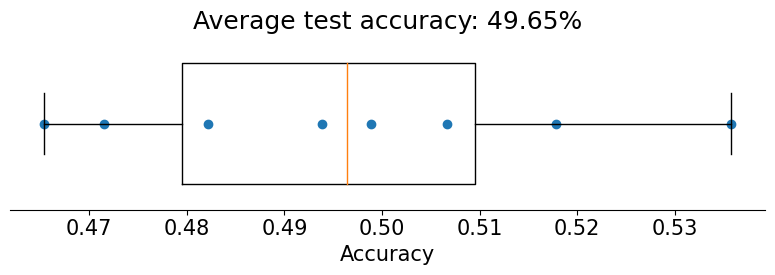

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

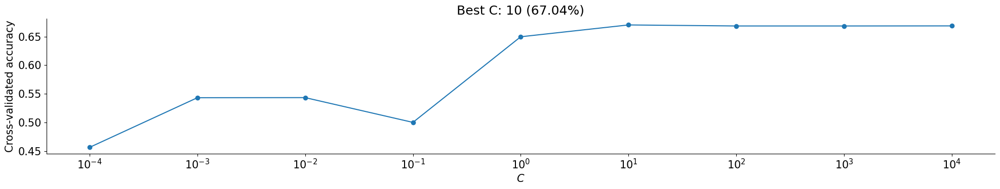

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

# Midbrain for all mice

In [ ]:
dat = alldat[2]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid(dat['spks'][barea==4].mean(axis=0).T) - 0.5
y = np.absolute(dat['response'])


contain_midbrain = [9, 12, 13, 14, 15, 17, 18, 21, 23, 24, 25, 27, 30, 31, 32, 33, 35, 36]
for i in contain_midbrain:
  dat = alldat[i]
  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  a = sigmoid(dat['spks'][barea==4].mean(axis=0).T) - 0.5
  X = np.hstack((X, a))
  b = np.absolute(dat['response'])
  y = np.hstack((y, b))
X = X.T



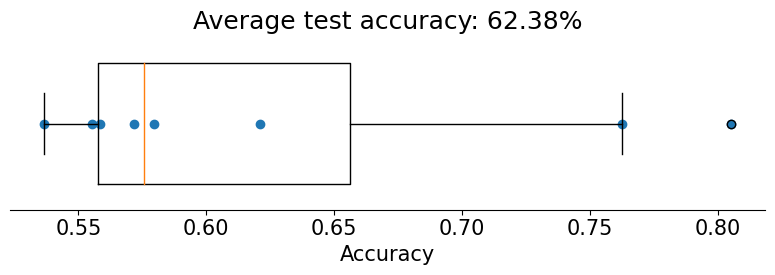

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
log_reg_l1 = LogisticRegression(penalty="l1", C=100, solver="saga", max_iter=5000)
log_reg_l1.fit(X, y)


LogisticRegression(C=100, max_iter=5000, penalty='l1', solver='saga')

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

KeyboardInterrupt: ignored

# Visual cortex all mice

[1, 2, 3, 4, 5, 8, 9, 10, 12, 13, 14, 19, 20, 22, 23, 24, 25, 26, 27, 28, 30, 35, 36, 37, 39]

In [ ]:
dat = alldat[0]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid(dat['spks'][barea==0].mean(axis=0).T) - 0.5
y = np.absolute(dat['response'])


contain_vc = [1, 2, 3, 4, 7, 8, 9, 11, 12, 13, 18, 19, 21, 22, 23, 24, 25, 26, 27, 29, 34, 35, 36, 38]
for i in contain_vc:
  dat = alldat[i]
  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  a = sigmoid(dat['spks'][barea==0].mean(axis=0).T) - 0.5
  X = np.hstack((X, a))
  b = np.absolute(dat['response'])
  y = np.hstack((y, b))
X = X.T


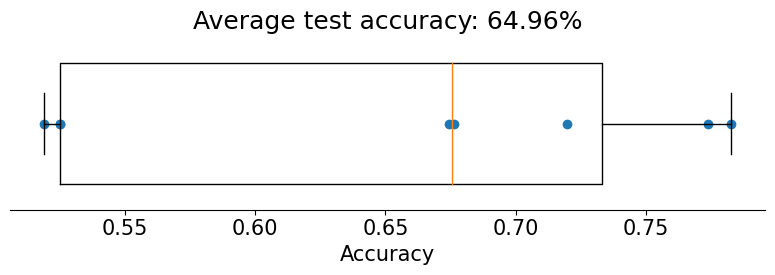

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

# Hippocampus all mice

1-10, 12-16, 18-20, 23, 24, 27, 28, 30, 31, 33, 35, 36, 38, 39

In [ ]:
dat = alldat[0]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid(dat['spks'][barea==2].mean(axis=0).T) - 0.5
y = np.absolute(dat['response'])


hippo = [1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 17, 18, 19, 22, 23, 26, 27, 29, 30, 32, 34, 35, 37, 38]
for i in hippo:
  dat = alldat[i]
  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  a = sigmoid(dat['spks'][barea==2].mean(axis=0).T) - 0.5
  X = np.hstack((X, a))
  b = np.absolute(dat['response'])
  y = np.hstack((y, b))
X = X.T


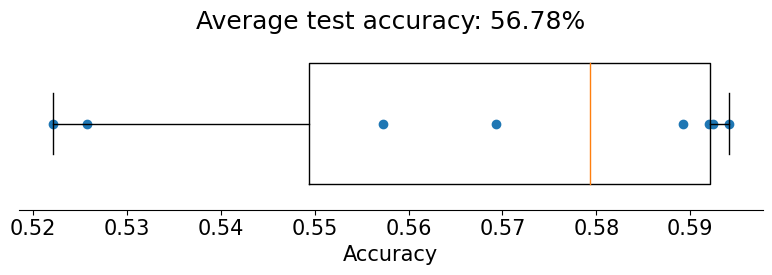

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

# Other ctx all mice

In [ ]:
1, 4-9, 11-14, 16, 21, 22, 24-32, 34-37, 39

In [ ]:
dat = alldat[0]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid(dat['spks'][barea==3].mean(axis=0).T) - 0.5
y = np.absolute(dat['response'])


hippo = [3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 15, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 38]
for i in hippo:
  dat = alldat[i]
  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  a = sigmoid(dat['spks'][barea==3].mean(axis=0).T) - 0.5
  X = np.hstack((X, a))
  b = np.absolute(dat['response'])
  y = np.hstack((y, b))
X = X.T

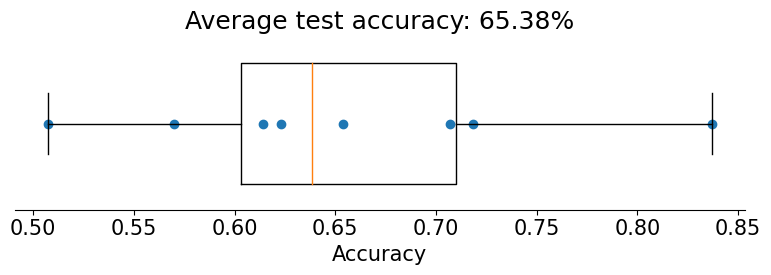

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

# Basal ganglia all mice

1, 4, 7-11, 13, 15, 18, 22, 27, 29-31, 33, 35, 38

In [ ]:
dat = alldat[0]
nareas = 6  # only the top 4 regions are in this particular mouse
NN = len(dat['brain_area'])  # number of neurons
barea = nareas * np.ones(NN, )  # last one is "other"
for j in range(nareas):
  barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
X = sigmoid(dat['spks'][barea==5].mean(axis=0).T) - 0.5
y = np.absolute(dat['response'])


hippo = [3, 6, 7, 8, 9, 10, 12, 14, 17, 21, 26, 28, 29, 30, 32, 34, 37]
for i in hippo:
  dat = alldat[i]
  nareas = 6  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  a = sigmoid(dat['spks'][barea==5].mean(axis=0).T) - 0.5
  X = np.hstack((X, a))
  b = np.absolute(dat['response'])
  y = np.hstack((y, b))
X = X.T
np.random.shuffle(y)

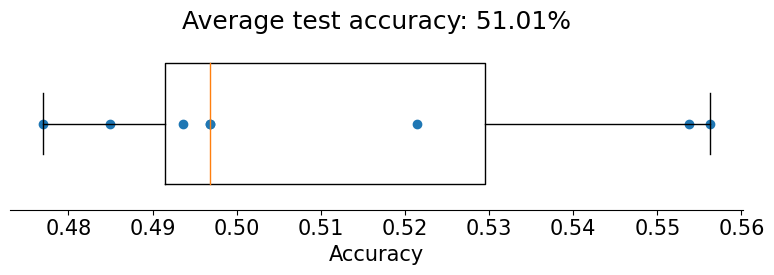

In [ ]:
accuracies = cross_val_score(LogisticRegression(penalty="l1", C=10000, solver="saga", max_iter=10000, class_weight='balanced'), X, y, cv=8)  # k=8 cross validation
# @markdown Run to plot out these `k=8` accuracy scores.
f, ax = plt.subplots(figsize=(8, 3))
ax.boxplot(accuracies, vert=False, widths=.7)
ax.scatter(accuracies, np.ones(8))
ax.set(
  xlabel="Accuracy",
  yticks=[],
  title=f"Average test accuracy: {accuracies.mean():.2%}"
)
ax.spines["left"].set_visible(False)
plt.show()

In [ ]:
# Use log-spaced values for C
C_values = np.logspace(-4, 4, 9)

# Compute accuracies
accuracies = model_selection(X, y, C_values)

# Visualize
plot_model_selection(C_values, accuracies)

#Other

Cori
Cori
Cori
Forssmann
Forssmann
Forssmann
Forssmann
Hench
Hench
Hench
Hench
Lederberg
Lederberg
Lederberg
Lederberg
Lederberg
Lederberg
Lederberg
Moniz
Moniz
Moniz
Muller
Muller
Muller
Radnitz
Radnitz
Radnitz
Radnitz
Radnitz
Richards
Richards
Richards
Richards
Richards
Tatum
Tatum
Tatum
Tatum
Theiler


<ipython-input-20-3a6bdb7ee19c>:24: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right > 0)].mean(axis=(0, 1)))
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
<ipython-input-20-3a6bdb7ee19c>:25: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right == 0)].mean(axis=(0, 1)))
<ipython-input-20-3a6bdb7ee19c>:26: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right == 0)].mean(axis=(0, 1)))
<ipython-input-20-3a6bdb7ee19c>:27: RuntimeWarning: Mean of empty slice.
  plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right > 0)].mean(axis=(0, 1)))


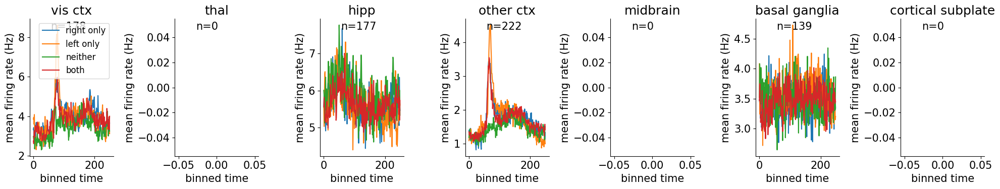

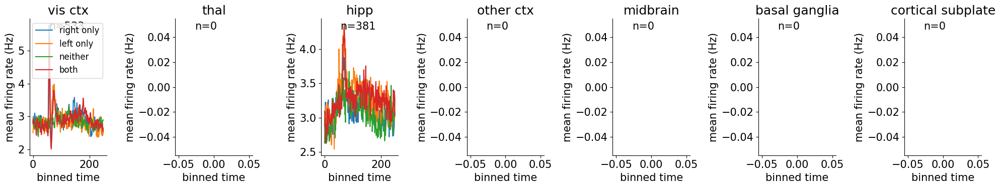

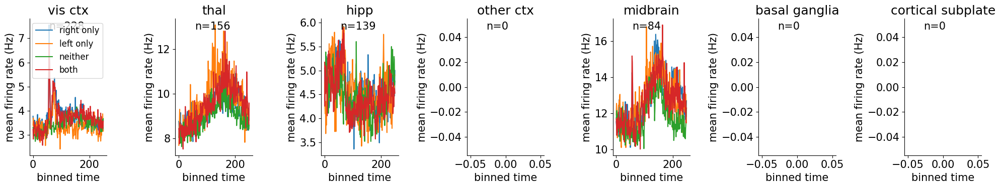

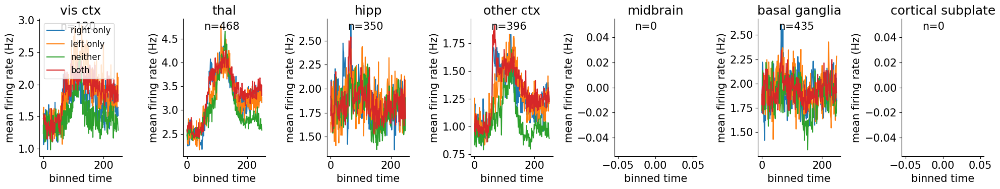

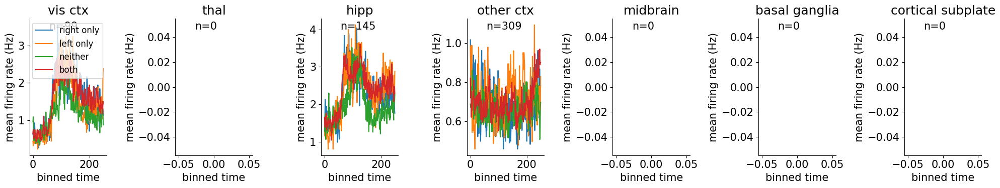

...

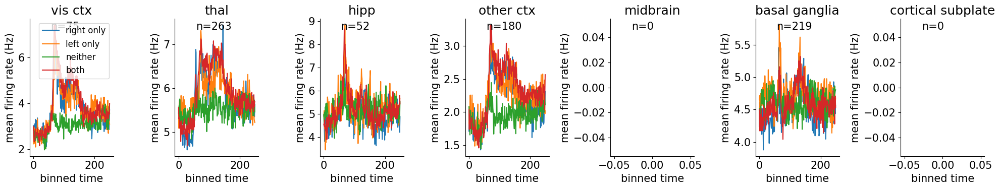

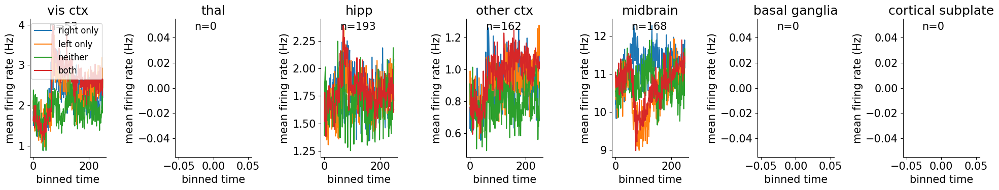

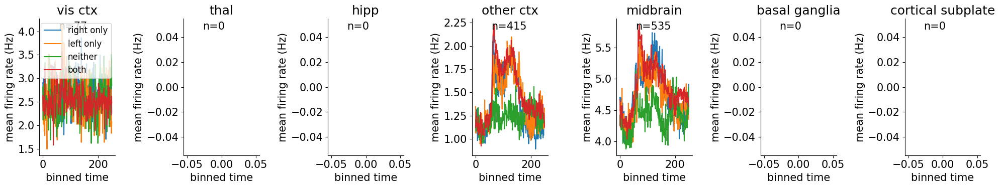

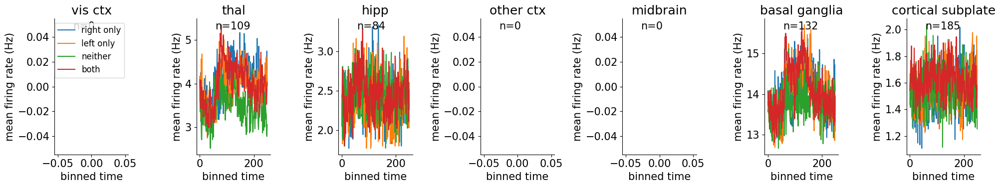

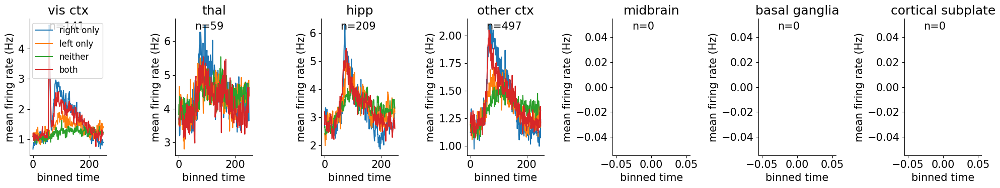

In [ ]:
for i in range(39):
  dat = alldat[i]
  print(dat['mouse_name'])

for i in range(39):
  dat = alldat[i]

  dt = dat['bin_size']  # binning at 10 ms
  NT = dat['spks'].shape[-1]

  response = dat['response']  # right - nogo - left (-1, 0, 1)
  vis_right = dat['contrast_right']  # 0 - low - high
  vis_left = dat['contrast_left']  # 0 - low - high

  nareas = 7  # only the top 4 regions are in this particular mouse
  NN = len(dat['brain_area'])  # number of neurons
  barea = nareas * np.ones(NN, )  # last one is "other"
  for j in range(nareas):
    barea[np.isin(dat['brain_area'], brain_groups[j])] = j  # assign a number to each region
  for j in range(nareas):
    ax = plt.subplot(1, nareas, j + 1)
    ax.set(title=(dat['mouse_name']))

    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right > 0)].mean(axis=(0, 1)))
    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right == 0)].mean(axis=(0, 1)))
    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left == 0, vis_right == 0)].mean(axis=(0, 1)))
    plt.plot(1/dt * dat['spks'][barea==j][:, np.logical_and(vis_left > 0, vis_right > 0)].mean(axis=(0, 1)))
    plt.text(.25, .92, 'n=%d'%np.sum(barea == j), transform=ax.transAxes)

    if j==0:
      plt.legend(['right only', 'left only', 'neither', 'both'], fontsize=12)

    ax.set(xlabel='binned time', ylabel='mean firing rate (Hz)', title=regions[j])
  plt.show()


# Conclusion



1. **Identifying Neural Correlations:** Our analysis has revealed a significant correlation between neural firing patterns in the midbrain and thalamus. This correlation underscores the intricate relationship between these two regions and hints at their coordinated involvement in processing sensory information.

2. **Enhancing Model Performance:** Our investigation into training models for distinct brain regions has yielded intriguing insights. Notably, we observed that training a model on brain regions specific to an individual session led to notably higher accuracy compared to a model trained on combined brain regions across all sessions. This finding underscores the importance of session-specific neural nuances in improving the predictive capabilities of our models.